# Zadanie domowe -- interpolacja dwusześcienna

Interpolacja dwusześcienna, to podobnie jak w przypadku interpolacji dwuliniowej, rozszerzenie idei interpolacji jednowymiarowej na dwuwymiarową siatkę.
W trakcie jej obliczania wykorzystywane jest 16 pikseli z otoczenia (dla dwuliniowej 4).
Skutkuje to zwykle lepszymi wynikami - obraz wyjściowy jest bardziej gładki i z mniejszą liczbą artefaktów.
Ceną jest znaczny wzrost złożoności obliczeniowej (zostało to zaobserwowane podczas ćwiczenia).

Interpolacja dana jest wzorem:
\begin{equation}
I(i,j) = \sum_{i=0}^{3} \sum_{j=0}^{3} a_{ij} x^i y^j
\end{equation}

Zadanie sprowadza się zatem do wyznaczenia 16 współczynników $a_{ij}$.
W tym celu wykorzystuje się, oprócz wartość w puntach $A$ (0,0), $B$ (1 0), $C$ (1,1), $D$ (0,1) (por. rysunek dotyczący interpolacji dwuliniowej), także pochodne cząstkowe $A_x$, $A_y$, $A_{xy}$.
Pozwala to rozwiązać układ 16-tu równań.

Jeśli zgrupujemy parametry $a_{ij}$:
\begin{equation}
a = [ a_{00}~a_{10}~a_{20}~a_{30}~a_{01}~a_{11}~a_{21}~a_{31}~a_{02}~a_{12}~a_{22}~a_{32}~a_{03}~a_{13}~a_{23}~a_{33}]
\end{equation}

i przyjmiemy:
\begin{equation}
x = [A~B~D~C~A_x~B_x~D_x~C_x~A_y~B_y~D_y~C_y~A_{xy}~B_{xy}~D_{xy}~C_{xy}]^T
\end{equation}

To zagadnienie można opisać w postaci równania liniowego:
\begin{equation}
Aa = x
\end{equation}
gdzie macierz $A^{-1}$ dana jest wzorem:

\begin{equation}
A^{-1} =
\begin{bmatrix}
1& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0 \\
0&  0&  0&  0&  1&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0 \\
-3&  3&  0&  0& -2& -1&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0 \\
2& -2&  0&  0&  1&  1&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0&  1&  0&  0&  0&  0&  0&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  1&  0&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0& -3&  3&  0&  0& -2& -1&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0&  2& -2&  0&  0&  1&  1&  0&  0 \\
-3&  0&  3&  0&  0&  0&  0&  0& -2&  0& -1&  0&  0&  0&  0&  0 \\
0&  0&  0&  0& -3&  0&  3&  0&  0&  0&  0&  0& -2&  0& -1&  0 \\
9& -9& -9&  9&  6&  3& -6& -3&  6& -6&  3& -3&  4&  2&  2&  1 \\
-6&  6&  6& -6& -3& -3&  3&  3& -4&  4& -2&  2& -2& -2& -1& -1 \\
2&  0& -2&  0&  0&  0&  0&  0&  1&  0&  1&  0&  0&  0&  0&  0 \\
0&  0&  0&  0&  2&  0& -2&  0&  0&  0&  0&  0&  1&  0&  1&  0 \\
-6&  6&  6& -6& -4& -2&  4&  2& -3&  3& -3&  3& -2& -1& -2& -1 \\
4& -4& -4&  4&  2&  2& -2& -2&  2& -2&  2& -2&  1&  1&  1&  1 \\
\end{bmatrix}
\end{equation}

Potrzebne w rozważaniach pochodne cząstkowe obliczane są wg. następującego przybliżenia (przykład dla punktu A):
\begin{equation}
A_x = \frac{I(i+1,j) - I(i-1,j)}{2}
\end{equation}

\begin{equation}
A_y = \frac{I(i,j+1) - I(i,j-1)}{2}
\end{equation}

\begin{equation}
A_{xy} = \frac{I(i+1,j+1) - I(i-1,j) - I(i,j-1) + I(i,j)}{4}
\end{equation}

## Zadanie

Wykorzystując podane informacje zaimplementuj interpolację dwusześcienną.
Uwagi:
- macierz $A^{-1}$ dostępna jest w pliku *a_invert.py*
- trzeba się zastanowić nad potencjalnym wykraczaniem poza zakres obrazka (jak zwykle).

Ponadto dokonaj porównania liczby operacji arytmetycznych i dostępów do pamięci koniecznych przy realizacji obu metod interpolacji: dwuliniowej i dwusześciennej.

In [1]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/05_Resolution/'

fileName = "ainvert.py"
if not os.path.exists(fileName):
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

import ainvert

In [2]:
def read_img(path):
    img = cv2.imread(path)    
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def plot_img(img, cmap='gray', title=''):
    plt.figure(figsize=(img.shape[0]/30,img.shape[1]/30))
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.title(title)
    plt.show()

In [14]:
def interpolate_bicubic(img, h_coef, w_coef):
    height, width = img.shape
    new_height, new_width = int(height * h_coef), int(width * w_coef)

    def Ax(h, w):
        try:
            return (img[h, w+1] - img[h, w-1]) / 2
        except IndexError:
            return 0
    
    def Ay(h, w):
        try:
            return (img[h+1, w] - img[h-1, w]) / 2
        except IndexError:
            return 0
            
    def Axy(h, w):
        try:
            return (img[h+1, w+1] - img[h-1, w+1] - img[h+1, w-1] + img[h-1, w-1]) / 4
        except IndexError:
            return 0
        
    new_img = np.zeros((new_height, new_width), np.uint8)
    for i in range(new_height):
        for j in range(new_width):
            A_x = int(i / h_coef)
            A_y = int(j / w_coef)

            B_x = min(A_x, height - 1)
            B_y = min(A_y + 1, width - 1)

            C_x = min(A_x + 1, height - 1)
            C_y = min(A_y + 1, width - 1)

            D_x = min(A_x, height - 1)
            D_y = min(A_y + 1, width - 1)

            i_coef = i / h_coef - A_x
            j_coef = j / w_coef - A_y


            x = np.array(
                [img[A_x, A_y], img[B_x, B_y], img[D_x, D_y], img[C_x, C_y],
                 Ax(A_x, A_y),  Ax(B_x, B_y),  Ax(D_x, D_y),  Ax(C_x, C_y),
                 Ay(A_x, A_y),  Ay(B_x, B_y),  Ay(D_x, D_y),  Ay(C_x, C_y),
                 Axy(A_x, A_y), Axy(B_x, B_y), Axy(D_x, D_y), Axy(C_x, C_y)], dtype=np.float64)
            
            a = (ainvert.A_invert @ x).reshape((4, 4)).T

            new_img[i, j] = np.power(j_coef, [0, 1, 2, 3]) @ a @ np.power(i_coef, [0, 1, 2, 3])

    return np.clip(new_img, 0, 255).astype(np.uint8)

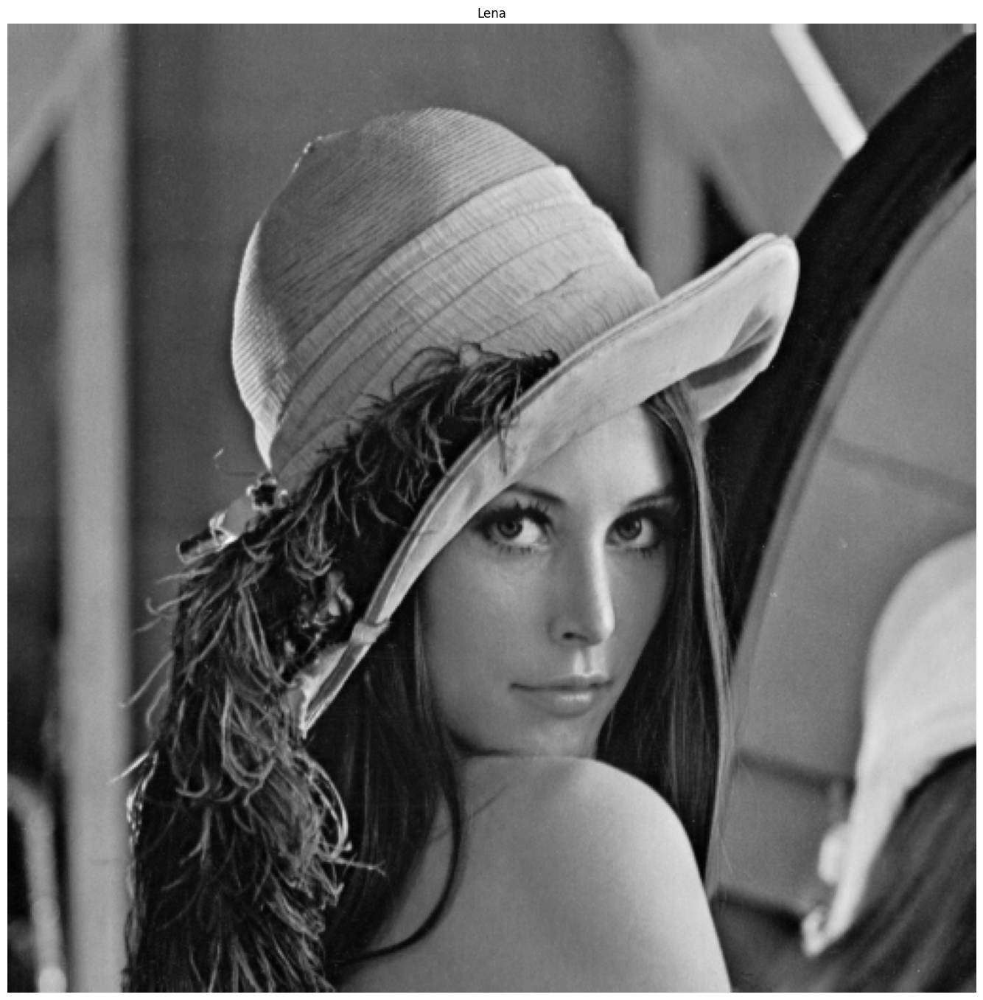

In [15]:
img_lena = read_img('lena.bmp')

plot_img(img_lena, title='Lena')

/var/folders/6n/s7fj6_r164d8m6lctbvln_cm0000gn/T/ipykernel_21577/2918510205.py:7: RuntimeWarning: overflow encountered in scalar subtract
  return (img[h, w+1] - img[h, w-1]) / 2
/var/folders/6n/s7fj6_r164d8m6lctbvln_cm0000gn/T/ipykernel_21577/2918510205.py:19: RuntimeWarning: overflow encountered in scalar subtract
  return (img[h+1, w+1] - img[h-1, w+1] - img[h+1, w-1] + img[h-1, w-1]) / 4
/var/folders/6n/s7fj6_r164d8m6lctbvln_cm0000gn/T/ipykernel_21577/2918510205.py:19: RuntimeWarning: overflow encountered in scalar add
  return (img[h+1, w+1] - img[h-1, w+1] - img[h+1, w-1] + img[h-1, w-1]) / 4
/var/folders/6n/s7fj6_r164d8m6lctbvln_cm0000gn/T/ipykernel_21577/2918510205.py:13: RuntimeWarning: overflow encountered in scalar subtract
  return (img[h+1, w] - img[h-1, w]) / 2


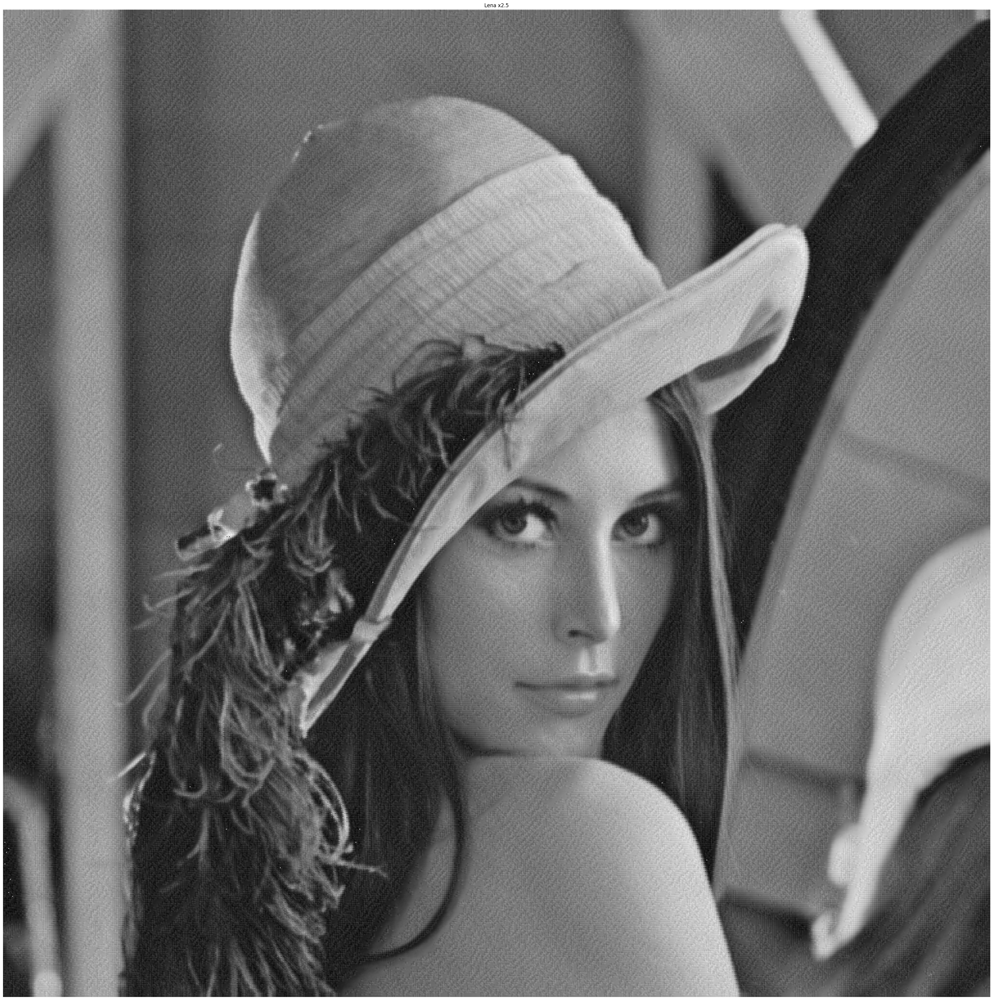

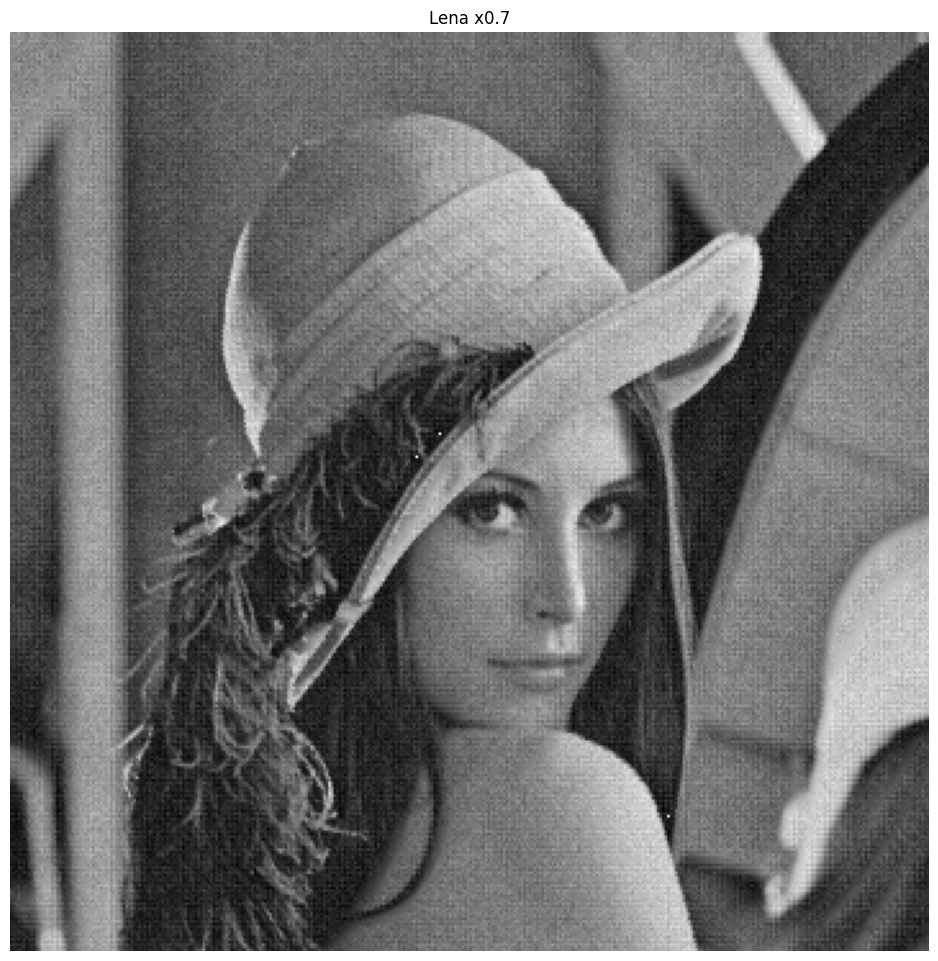

In [19]:
plot_img(interpolate_bicubic(img_lena, 2.5, 2.5), title='Lena x2.5')
plot_img(interpolate_bicubic(img_lena, 0.7, 0.7), title='Lena x0.7')

### Porównanie interpolacji dwuliniowej i dwusześciennej
Ostatnia część zadania dotyczy porównania dwóch metod interpolacji, co jest kluczowe do zrozumienia ich relatywnych zalet i wad pod względem wydajności i jakości obrazu wynikowego:

- **Liczba operacji arytmetycznych**: Interpolacja dwusześcienna wymaga znacząco więcej mnożeń i dodawań niż interpolacja dwuliniowa, ponieważ korzysta z 16 wartości pikseli do wyliczenia wartości jednego nowego piksela (w dwuliniowej są to tylko 4 wartości piksli).

- **Dostęp do pamięci**: Metoda dwusześcienna wiąże się również z większą liczbą dostępów do pamięci, co może wpłynąć na jej wydajność w scenariuszach wymagających szybkiego przetwarzania obrazu. Większa ilość danych wejściowych może skutkować wolniejszym dostępem do pamięci szczególnie w przypadkach, kiedy dane nie mieszczą się w cache procesora.

### Podsumowanie
Rozważając obie metody, interpolacja dwusześcienna oferuje wyższą jakość obrazu kosztem zwiększonego obciążenia obliczeniowego i pamięciowego, co może być istotnym czynnikiem przy przetwarzaniu obrazów o bardzo wysokiej rozdzielczości lub w aplikacjach, które wymagają szybkiego przetwarzania graficznego. Wybór metody zależy od wymagań konkretnego zastosowania.